In [3]:
from depth_height import *
from math import tan, radians
from PIL import Image

In [4]:
folder = '/network/tmp1/ccai/data/sim_dataset_12182019/'

#choose image number
im_id = '002'

In [5]:
depth_path = os.path.join(folder, 'Depth/'+im_id+'.png')
seg_path = os.path.join(folder, 'Segmentation/'+ im_id +'.png')
im_path = os.path.join(folder, 'Normal/'+ im_id +'.png')

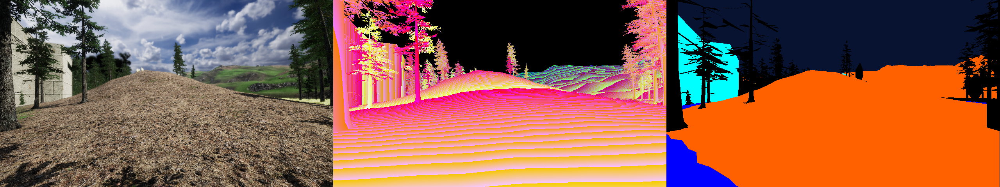

In [6]:
#check what the images look like
images = [Image.open(x) for x in [im_path, depth_path, seg_path]]
widths, heights = zip(*(i.size for i in images))
total_width = sum(widths)
max_height = max(heights)
new_im = Image.new('RGB', (int(total_width/3), int(max_height/3)))
x_offset = 0
for im in images:
    new_im.paste(im.resize((int(im.size[0]/3), int(im.size[1]/3))), (x_offset,0))
    x_offset += int(im.size[0]/3)

new_im

In [17]:
depth = np.array(Image.open(depth_path))
seg = np.array(Image.open(seg_path))

In [41]:
depth_metric, coords, h, params = get_height(depth_path, os.path.join(folder, 'JSON/002.json'), water_height = 0.45)

{'cam_height': 2.731494140625, 'pitch': 0.38348388671875, 'FOVy': 60.0, 'far': 1000.0}


In [42]:
#geometrically, using camera params, the closest point on the ground should be at depth d from the camera defined as :
d = params["cam_height"] / tan(radians(params['FOVy']/2))
#compare what we should get with cam params assuming ground is flat and the minimum value of depth that we get 
d, depth_metric.min()

(4.7310866321391885, 5.914273519907322)

In [43]:
depth_metric

array([[  16.78759425,   16.79165905,   16.79978863, ...,   54.32595573,
          54.31376136,   54.30156698],
       [  16.78759425,   16.79165905,   16.79572384, ...,   54.35034449,
          54.33815011, 1029.13643477],
       [  16.78352946,   16.79165905,   16.79572384, ...,   54.37473325,
          52.0293478 ,   52.39924395],
       ...,
       [   6.84104628,    6.84104628,    6.84104628, ...,    5.9264679 ,
           5.9264679 ,    5.9264679 ],
       [   6.83291669,    6.8288519 ,    6.8288519 , ...,    5.92240311,
           5.92240311,    5.92240311],
       [   6.82072231,    6.82072231,    6.82072231, ...,    5.91427352,
           5.91427352,    5.91427352]])

In [44]:
h -= h.min()

In [62]:
indices = np.where(h< 0.7)
img = Image.open(im_path)
for i in range(len(indices[0])):
    img.putpixel((indices[1][i], indices[0][i]), (0,0,255))

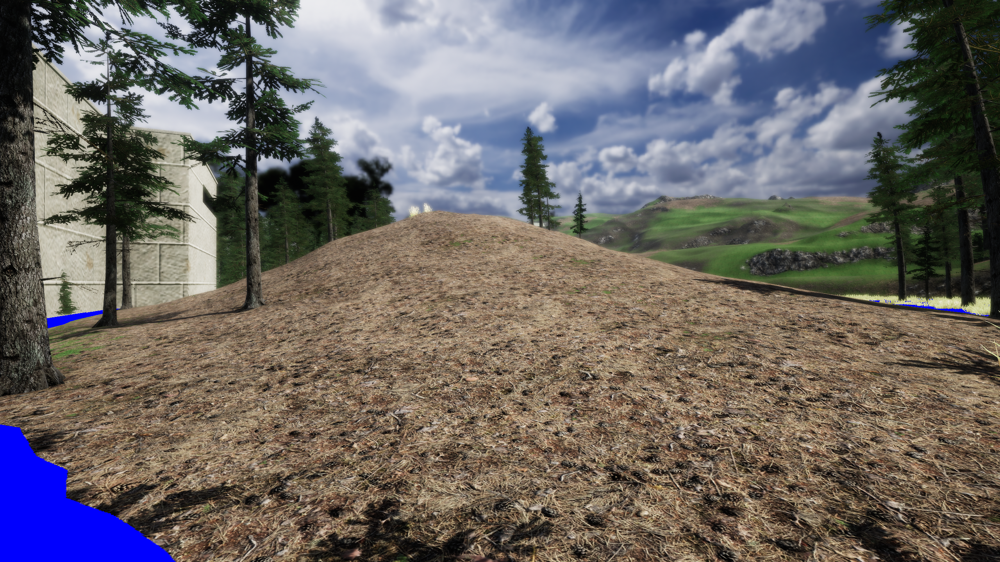

In [63]:
img